#  Twin network that uses binary cross-entropy

##Build Architecture

In [ ]:
import os
import cv2
import keras
import random
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [ ]:
PATH = "/content/drive/MyDrive/fingerprint_bitmaps"


In [ ]:
import cv2
import numpy as np
import os

def load_raw_data(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Path '{path}' does not exist.")

    all_images = []
    all_labels = []

    files = os.listdir(path)
    print("First 10 files:", files[:10])

    for file_name in files:
        if not file_name.endswith(".bmp"):
            continue

        class_label = file_name.split("_")[0]

        img_path = os.path.join(path, file_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            print(f"Skipping unreadable image: {img_path}")
            continue

        img = np.reshape(img, (img.shape[0], img.shape[1], 1))

        all_images.append(img)
        all_labels.append(class_label)

    all_images = np.array(all_images)
    all_labels = np.array(all_labels)

    print("Loaded images:", all_images.shape)
    print("Unique classes:", np.unique(all_labels))

    return all_images, all_labels

all_images, all_labels = load_raw_data(PATH)


First 10 files: ['1_7.bmp', '10_5.bmp', '1_2.bmp', '10_1.bmp', '1_1.bmp', '1_5.bmp', '1_4.bmp', '1_6.bmp', '1_8.bmp', '10_4.bmp']
Loaded images: (168, 256, 256, 1)
Unique classes: ['1' '10' '11' '12' '13' '14' '15' '16' '17' '18' '19' '2' '20' '21' '3'
 '4' '5' '6' '7' '8' '9']


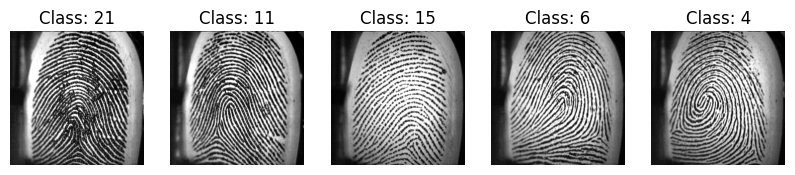

In [ ]:
import random
import matplotlib.pyplot as plt

def show_random_samples(images, labels, num_samples=5):
    unique_classes = np.unique(labels)
    selected_images = []
    selected_labels = []

    sampled_classes = np.random.choice(unique_classes, min(num_samples, len(unique_classes)), replace=False)

    for class_label in sampled_classes:
        indices = np.where(labels == class_label)[0]
        random_index = np.random.choice(indices)
        selected_images.append(images[random_index])
        selected_labels.append(labels[random_index])

    plt.figure(figsize=(10, 5))
    for i in range(len(selected_images)):
        plt.subplot(1, len(selected_images), i + 1)
        plt.imshow(selected_images[i].squeeze(), cmap="gray")
        plt.title(f"Class: {selected_labels[i]}")
        plt.axis("off")
    plt.show()

show_random_samples(all_images, all_labels, num_samples=5)


In [ ]:
import cv2
import numpy as np
import os


def preprocess_data(images, target_size=(128, 128)):
    """ Preprocess images: resize, normalize, and reshape """
    processed_images = []
    for img in images:
        img = cv2.resize(img, target_size)  # Resize image
        img = img.astype(np.float32) / 255.0  # Normalize to [0,1]
        img = np.expand_dims(img, axis=-1)  # Ensure shape (H, W, 1)
        processed_images.append(img)

    return np.array(processed_images)


# Apply preprocessing after loading
all_images = preprocess_data(all_images)

print("Preprocessed images shape:", all_images.shape)


Preprocessed images shape: (168, 128, 128, 1)


In [ ]:
def generate_dataset(images, labels, dataset_size):
    X = []

    classes = np.unique(labels)
    class_finger = []
    class_idx = {}

    for i in range(len(classes)):
        class_finger.append(np.where(labels == classes[i])[0])
        class_idx[str(classes[i])] = i

    required_iterations = int(dataset_size / len(images))


    for itr in range(required_iterations):
        for i in range(len(images)):
            anchor = images[i]
            anchor_label = labels[i]

            pos_idx = random.choice(class_finger[class_idx[str(anchor_label)]])
            positive = images[pos_idx]

            different_class = random.randint(0, len(classes) - 1)
            while different_class == class_idx[str(anchor_label)]:
                different_class = random.randint(0, len(classes) - 1)

            neg_idx = random.choice(class_finger[different_class])
            negative = images[neg_idx]

            X.append([anchor, positive, negative])

    return np.array(X)

In [ ]:
DATASET_SIZE = 4800
preprocessed_images = preprocess_data(all_images)
X = generate_dataset(preprocessed_images, all_labels, DATASET_SIZE)
y = np.zeros((X.shape[0],))

In [ ]:
print(f"Generated dataset shape: {X.shape}")

Generated dataset shape: (4704, 3, 128, 128, 1)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


print(f"Training set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")

Training set shape: (3763, 3, 128, 128, 1)
Test set shape: (941, 3, 128, 128, 1)


In [ ]:
NUM_CLASSES = 21
DATASET_SIZE = 4800

In [ ]:
def generate_dataset(all_images, all_labels):
    X = []
    y = []

    classes = np.unique(all_labels)
    class_images = []
    class_idx = {}

    for i in range(NUM_CLASSES):
        class_images += [(all_labels == classes[i]).nonzero()[0]]
        class_idx[classes[i]] = i

    required_iterations = int(DATASET_SIZE/(len(all_images)*2))

    for itr in range(required_iterations):
        for i in range(len(all_images)):
            # generate a positive example
            x1 = all_images[i]
            x1_lbl = all_labels[i]

            x2_idx = random.choice(class_images[class_idx[x1_lbl]])
            x2 = all_images[x2_idx]

            X += [[x1, x2]]
            y += [1]

            # generate a negative example
            different_class = random.randint(0, NUM_CLASSES-1)
            while different_class == class_idx[x1_lbl]:
                different_class = random.randint(0, NUM_CLASSES-1)

            x2_idx2 = random.choice(class_images[different_class])
            x2 = all_images[x2_idx2]

            X += [[x1, x2]]
            y += [0]

    return np.array(X), np.array(y)

In [ ]:
X, y = generate_dataset(all_images, all_labels)

In [ ]:
X.shape

(4704, 2, 128, 128, 1)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=42)


In [ ]:
np.unique(y_train, return_counts=True)


(array([0, 1]), array([1657, 1635]))

In [ ]:
img_shape = x_train[0][0].shape


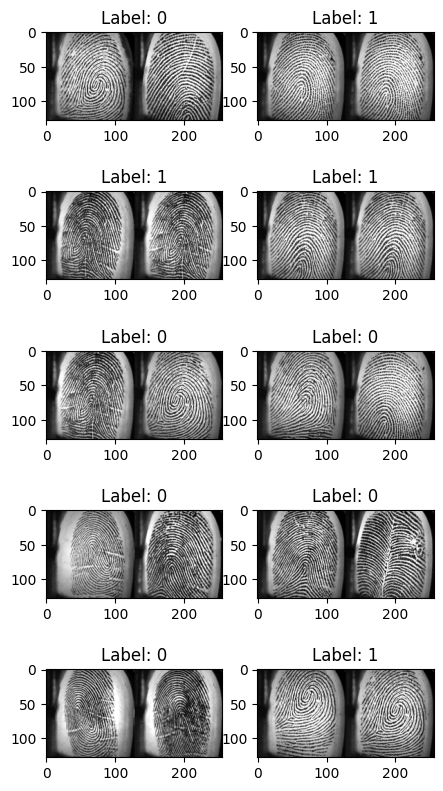

In [ ]:
fig, axes = plt.subplots(5, 2, figsize=(5, 10))
for i in range(10):
    ax = axes[i // 2, i % 2]
    img_idx = random.randint(0, len(x_train))
    ax.imshow(keras.ops.concatenate([x_train[img_idx][0], x_train[img_idx][1]], axis=1), cmap='gray')
    ax.set_title("Label: {}".format(y_train[img_idx]))

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input, Lambda
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K

def embedding_network(input_shape):
    input_layer = Input(shape=input_shape)

    x = Conv2D(64, (3, 3), activation="relu", padding="same")(input_layer)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = Conv2D(128, (3, 3), activation="relu", padding="same")(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = Conv2D(256, (3, 3), activation="relu", padding="same")(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = Conv2D(512, (3, 3), activation="relu", padding="same")(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = Flatten()(x)
    x = Dense(512, activation="relu")(x)
    x = Dropout(0.4)(x)
    x = Dense(256, activation="relu")(x)
    x = Dropout(0.4)(x)

    return Model(input_layer, x, name="EmbeddingNetwork")

def cosine_similarity(vectors):
    v1, v2 = vectors
    v1 = K.l2_normalize(v1, axis=-1)
    v2 = K.l2_normalize(v2, axis=-1)
    return K.sum(v1 * v2, axis=-1, keepdims=True)

def SiameseNetwork(input_shape):
    input_1 = Input(input_shape)
    input_2 = Input(input_shape)

    embedding_model = embedding_network(input_shape)

    encoded_1 = embedding_model(input_1)
    encoded_2 = embedding_model(input_2)

    similarity = Lambda(cosine_similarity)([encoded_1, encoded_2])

    output = Dense(1, activation="sigmoid")(similarity)

    return Model(inputs=[input_1, input_2], outputs=output)

def binary_loss(y_true, y_pred):
    return keras.losses.binary_crossentropy(y_true, y_pred)

def custom_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(y_true, y_pred)

input_shape = (128, 128, 1)
siamese_model = SiameseNetwork(input_shape)

siamese_model.compile(loss=binary_loss, optimizer=keras.optimizers.Adam(learning_rate=0.0001), metrics=[custom_accuracy])
siamese_model.summary()


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_26            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_27            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ EmbeddingNetwork          │ (None, 256)            │     18,462,720 │ input_layer_26[0][0],  │
│ (Functional)              │                        │                │ input_layer_27[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_11 (Lambda)        │ (None, 1)              │              0 │ EmbeddingNetwork[0][0… │
│                           │                        │                │ EmbeddingNetwork[1][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_21 (Dense)          │ (None, 1)              │              2 │ lambda_11[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 18,462,722 (70.43 MB)

 Trainable params: 18,460,802 (70.42 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [ ]:
#5. Fit the model
history = siamese_model.fit(
    [x_train[:,0], x_train[:,1]],
    y_train,
    validation_data=([x_test[:,0], x_test[:,1]], y_test),
    batch_size=100,
    epochs=10,
)

Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 39s 737ms/step - custom_accuracy: 0.4909 - loss: 0.6924 - val_custom_accuracy: 0.5078 - val_loss: 0.7457
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 317ms/step - custom_accuracy: 0.4901 - loss: 0.6618 - val_custom_accuracy: 0.5078 - val_loss: 0.7457
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 314ms/step - custom_accuracy: 0.5102 - loss: 0.6470 - val_custom_accuracy: 0.5078 - val_loss: 0.7457
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 11s 320ms/step - custom_accuracy: 0.5523 - loss: 0.6394 - val_custom_accuracy: 0.5078 - val_loss: 0.7457
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 11s 330ms/step - custom_accuracy: 0.6038 - loss: 0.6340 - val_custom_accuracy: 0.5078 - val_loss: 0.7448
Epoch 6/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 314ms/step - custom_accuracy: 0.6572 - loss: 0.6316 - val_custom_accuracy: 0.5078 - val_loss: 0.7416
Epoch 7/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 11s 322ms/step - custom_accuracy: 0.7190 - loss: 0.6271 - val_custom_accuracy: 0.5078 - val_loss: 0.7284

In [ ]:

#6. Test and evaluate the model
results = siamese_model.evaluate([x_test[:,0], x_test[:,1]], y_test)
print("test loss, test acc:", results)

45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - custom_accuracy: 0.8616 - loss: 0.5714
test loss, test acc: [0.5715851187705994, 0.8576487302780151]


45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step


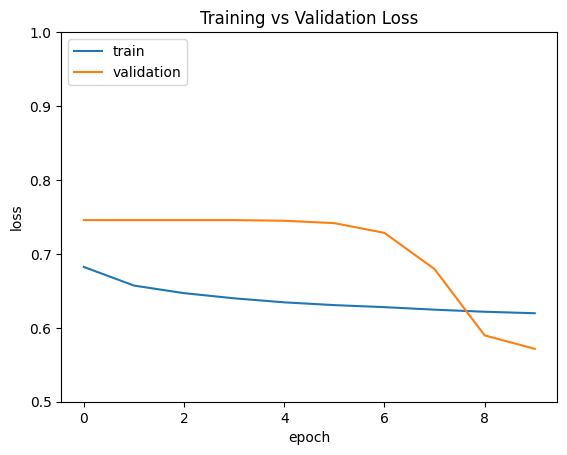

In [ ]:
custom_accuracy(y_test, siamese_model.predict([x_test[:,0], x_test[:,1]]))

plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train", "validation"], loc="upper left")
plt.title("Training vs Validation Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.ylim(0.5, 1.0)  # Set y-axis limits
plt.show()


45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step


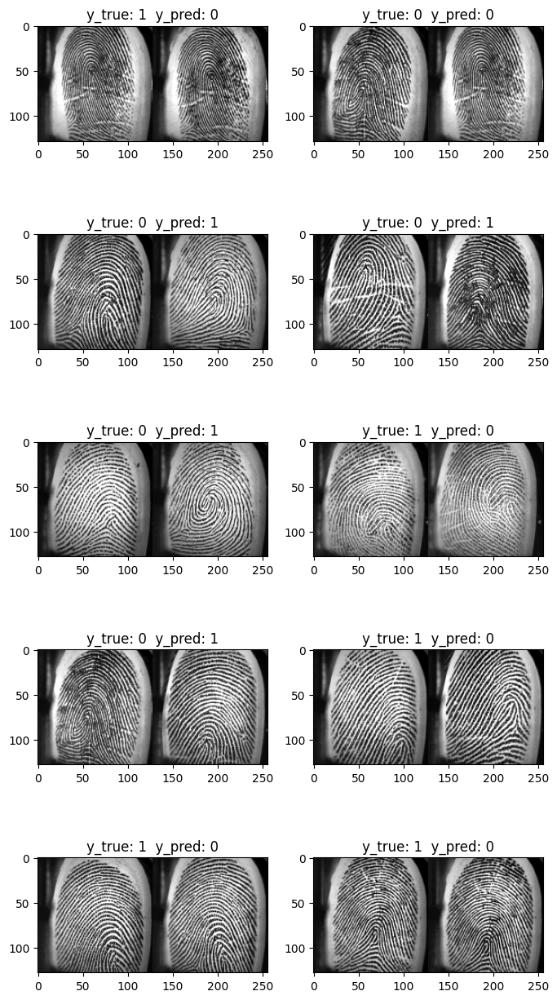

In [ ]:

predictions = siamese_model.predict([x_test[:,0], x_test[:,1]])
fig, axes = plt.subplots(5, 2, figsize=(8, 16))
for i in range(10):
    ax = axes[i // 2, i % 2]
    img_idx = random.randint(0, len(x_test))
    ax.imshow(keras.ops.concatenate([x_test[img_idx][0], x_test[img_idx][1]], axis=1), cmap='gray')
    ax.set_title("y_true: {}".format(y_test[img_idx]) + "  y_pred: {}".format(int(predictions[img_idx][0]<0.5)))


45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
Precision: 0.7810, Recall: 1.0000, F1-score: 0.8771, AUC: 0.9821


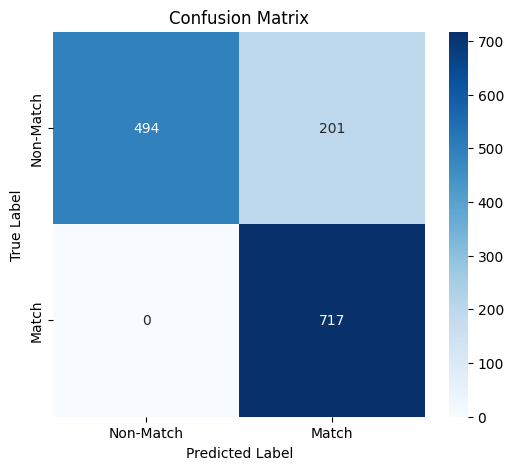

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score

# Get model predictions
y_pred = siamese_model.predict([x_test[:, 0], x_test[:, 1]])
y_pred_binary = (y_pred > 0.5).astype(int)

# Compute performance metrics
precision = precision_score(y_test, y_pred_binary)
recall = recall_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
auc = roc_auc_score(y_test, y_pred)

# Print metrics
print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, AUC: {auc:.4f}")

# Compute Confusion Matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Plot Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Non-Match", "Match"], yticklabels=["Non-Match", "Match"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


##Resnet

In [ ]:
# Building the Model
#1. Build the Embedding Network Structure
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Input, Conv2D

def embedding_network(in_shape):
    input_layer = Input(shape=in_shape)

    # Convert 1-channel to 3-channel by repeating it
    x = Conv2D(3, (1, 1), activation=None)(input_layer)  # 1x1 Conv to expand channels

    base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(128, 128, 3))
    base_model.trainable = False  # Freeze ResNet50 layers

    x = base_model(x, training=False)
    x = Flatten()(x)
    x = BatchNormalization()(x)
    x = Dense(128, activation="relu")(x)
    x = Dense(52, activation="relu")(x)

    return Model(inputs=input_layer, outputs=x)


#2. Build the Siamese Network Structure
# Define the energy function
def euclidean_distance(vectors):
        vector1, vector2 = vectors
        sum_square = keras.ops.sum(keras.ops.square(vector1 - vector2), axis=1, keepdims=True)
        return keras.ops.sqrt(keras.ops.maximum(sum_square, keras.backend.epsilon()))

def SiameseNetwork(in_shape):
    # 2.1. Define the twin networks using the embedding network
    input_1 = keras.layers.Input(in_shape)
    input_2 = keras.layers.Input(in_shape)

    # The siamese network shares weights between twin networks.
    #To allow this, we will use the same embedding network for both networks.
    embedding_net_obj = embedding_network(in_shape)

    twin_1 = (embedding_net_obj)(input_1)
    twin_2 = (embedding_net_obj)(input_2)

    # 2.2. Make sure the energy function has been defined

    # 2.3. Merge the twin networks using the energy function
    merge_layer = keras.layers.Lambda(euclidean_distance, output_shape=(1,))([twin_1, twin_2])

    # 2.4. Normalize and send to sigmoid (optional step)
    norm_layer = keras.layers.BatchNormalization()(merge_layer)
    output_layer = keras.layers.Dense(1, activation="sigmoid")(norm_layer)

    return keras.Model(inputs=[input_1, input_2], outputs=output_layer)

#3. Define the loss function
def loss():
    def binary_cross_entropy(Y, D):  # Y = true labels, D = predicted values
        return keras.ops.mean(keras.losses.binary_crossentropy(Y, D))

    return binary_cross_entropy

#4. Instantiate and compile the model
def custom_accuracy(y_true, y_pred):
    return keras.ops.mean(keras.ops.equal(y_true, keras.ops.cast(y_pred[:,0] < 0.5, "int32")))
siamese_model = SiameseNetwork(img_shape)
siamese_model.compile(loss=loss(), optimizer="adam", metrics=[custom_accuracy])
siamese_model.summary()


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_22            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional_13             │ (None, 52)             │     27,919,930 │ input_layer_21[0][0],  │
│ (Functional)              │                        │                │ input_layer_22[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_6 (Lambda)         │ (None, 1)              │              0 │ functional_13[0][0],   │
│                           │                        │                │ functional_13[1][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_39    │ (None, 1)              │              4 │ lambda_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_22 (Dense)          │ (None, 1)              │              2 │ batch_normalization_3… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 27,919,936 (106.51 MB)

 Trainable params: 4,266,686 (16.28 MB)

 Non-trainable params: 23,653,250 (90.23 MB)

In [ ]:
#5. Fit the model
history = siamese_model.fit(
    [x_train[:,0], x_train[:,1]],
    y_train,
    validation_data=([x_test[:,0], x_test[:,1]], y_test),
    batch_size=100,
    epochs=10,
)

Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 57s 1000ms/step - custom_accuracy: 0.5617 - loss: 0.7097 - val_custom_accuracy: 0.7273 - val_loss: 0.6974
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 13s 392ms/step - custom_accuracy: 0.5028 - loss: 0.6961 - val_custom_accuracy: 0.6493 - val_loss: 0.6971
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 380ms/step - custom_accuracy: 0.4874 - loss: 0.6939 - val_custom_accuracy: 0.5440 - val_loss: 0.6951
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 21s 394ms/step - custom_accuracy: 0.4746 - loss: 0.6934 - val_custom_accuracy: 0.5380 - val_loss: 0.6952
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 21s 397ms/step - custom_accuracy: 0.4878 - loss: 0.6936 - val_custom_accuracy: 0.5547 - val_loss: 0.6956
Epoch 6/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 21s 399ms/step - custom_accuracy: 0.4473 - loss: 0.6907 - val_custom_accuracy: 0.5573 - val_loss: 0.6958
Epoch 7/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 388ms/step - custom_accuracy: 0.4456 - loss: 0.6901 - val_custom_accuracy: 0.5518 - val_loss: 0.697

In [ ]:

#6. Test and evaluate the model
results = siamese_model.evaluate([x_test[:,0], x_test[:,1]], y_test)
print("test loss, test acc:", results)

45/45 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - custom_accuracy: 1.0000 - loss: 0.1185
test loss, test acc: [0.11906423419713974, 1.0]


45/45 ━━━━━━━━━━━━━━━━━━━━ 16s 201ms/step


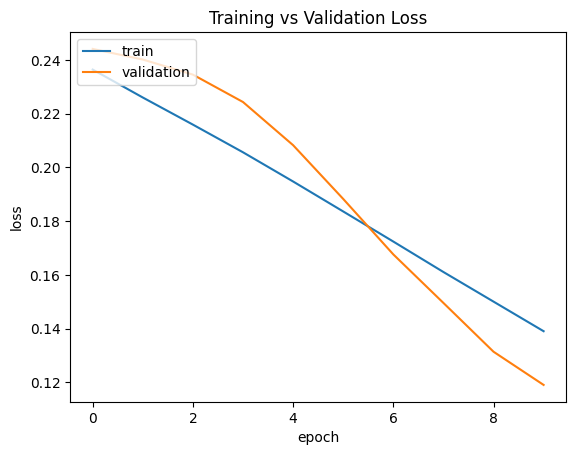

In [ ]:

custom_accuracy(y_test, siamese_model.predict([x_test[:,0], x_test[:,1]]))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train", "validation"], loc="upper left")
plt.title("Training vs Validation Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step


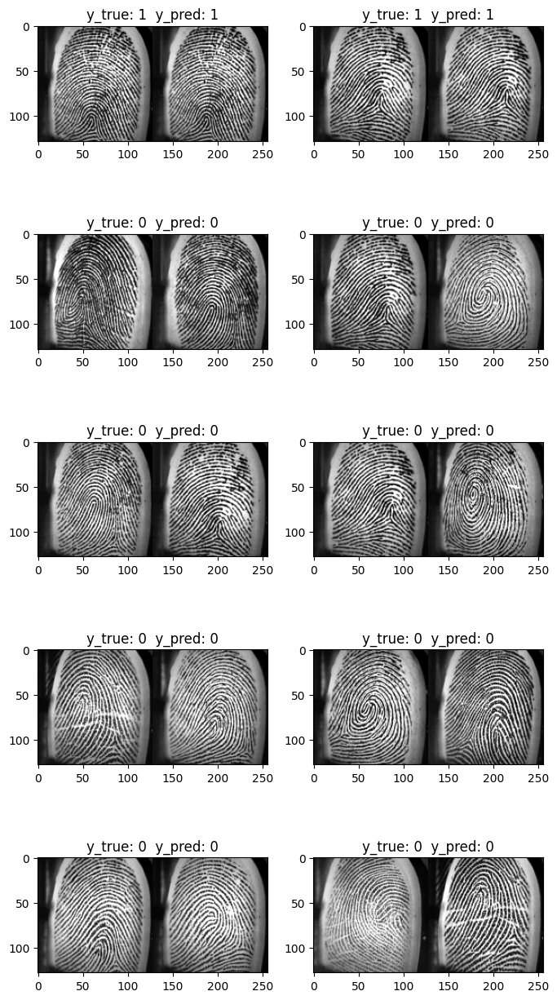

In [ ]:

predictions = siamese_model.predict([x_test[:,0], x_test[:,1]])
fig, axes = plt.subplots(5, 2, figsize=(8, 16))
for i in range(10):
    ax = axes[i // 2, i % 2]
    img_idx = random.randint(0, len(x_test))
    ax.imshow(keras.ops.concatenate([x_test[img_idx][0], x_test[img_idx][1]], axis=1), cmap='gray')
    ax.set_title("y_true: {}".format(y_test[img_idx]) + "  y_pred: {}".format(int(predictions[img_idx][0]<0.5)))


## Best Model

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models, applications
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import random
import cv2
import zipfile
import io
from google.colab import files

In [ ]:
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

def load_fingerprint_dataset(zip_path=None):
    """
    Load fingerprint images from a zip file or uploaded file
    """
    if zip_path is None:
        uploaded = files.upload()
        for fn in uploaded.keys():
            print(f'User uploaded file "{fn}" with length {len(uploaded[fn])} bytes')
            zip_path = fn

    images = []
    labels = []

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        file_list = [f for f in zip_ref.namelist() if f.endswith('.bmp')]
        print(f"First 10 files: {file_list[:10]}")

        for file_name in file_list:
            if not file_name.endswith('.bmp'):
                continue

            # Extract label (finger ID) from filename
            label = file_name.split('_')[0]

            with zip_ref.open(file_name) as file:
                file_bytes = io.BytesIO(file.read())
                img = cv2.imdecode(np.frombuffer(file_bytes.read(), np.uint8), cv2.IMREAD_GRAYSCALE)

                if img is not None:
                    images.append(img)
                    labels.append(label)

    # Convert to numpy arrays
    X = np.array(images)
    y = np.array(labels)

    # Reshape to include channel dimension
    X = X.reshape(X.shape[0], X.shape[1], X.shape[2], 1)

    print(f"Loaded images: {X.shape}")
    print(f"Unique classes: {np.unique(y)}")

    return X, y

In [ ]:
def preprocess_images(images):
    """
    Preprocess fingerprint images
    """
    processed_images = []

    for img in images:
        # Normalize to [0, 1]
        img_norm = img / 255.0

        # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        img_clahe = clahe.apply((img_norm * 255).astype(np.uint8))
        img_clahe = img_clahe / 255.0

        # Apply Gaussian blur to reduce noise
        img_blur = cv2.GaussianBlur(img_clahe, (3, 3), 0)

        # Resize (if needed)
        img_resized = cv2.resize(img_blur, (128, 128))

        processed_images.append(img_resized)

    processed_images = np.array(processed_images).reshape(-1, 128, 128, 1)
    return processed_images

In [ ]:
def create_pairs(images, labels):
    """
    Create positive and negative pairs for Siamese network training
    """
    pairs = []
    labels_pairs = []

    # Group images by their labels
    label_to_indices = {}
    for i, label in enumerate(labels):
        if label not in label_to_indices:
            label_to_indices[label] = []
        label_to_indices[label].append(i)

    # Create positive pairs (same label)
    for label, indices in label_to_indices.items():
        if len(indices) < 2:
            continue

        # Use a more balanced approach for positive pairs
        # For each image, create at most 3 positive pairs
        for i in range(len(indices)):
            positive_samples = min(3, len(indices) - 1)
            positive_indices = [j for j in range(len(indices)) if j != i]
            positive_indices = random.sample(positive_indices, positive_samples)

            for j in positive_indices:
                pairs.append([images[indices[i]], images[indices[j]]])
                labels_pairs.append(1)  # 1 for same class

    # Create negative pairs (different labels)
    # Try to balance the dataset by creating approximately the same number of negative pairs
    num_positive = len(labels_pairs)
    num_negative_per_class = num_positive // len(label_to_indices)

    negative_count = 0
    for i, (label1, indices1) in enumerate(label_to_indices.items()):
        other_labels = [l for l in label_to_indices.keys() if l != label1]

        for label2 in other_labels:
            indices2 = label_to_indices[label2]

            # Limit number of negative pairs per class
            pairs_to_create = min(num_negative_per_class // len(other_labels), len(indices1) * len(indices2))

            if pairs_to_create <= 0:
                continue

            # Randomly select pairs
            for _ in range(pairs_to_create):
                idx1 = random.choice(indices1)
                idx2 = random.choice(indices2)

                pairs.append([images[idx1], images[idx2]])
                labels_pairs.append(0)  # 0 for different class
                negative_count += 1

                if negative_count >= num_positive:
                    break

            if negative_count >= num_positive:
                break

        if negative_count >= num_positive:
            break

    return np.array(pairs), np.array(labels_pairs)

In [ ]:
def display_pairs(pair_images, pair_labels, n=5):
    """
    Display some sample pairs
    """
    plt.figure(figsize=(10, 4))

    for i in range(min(n, len(pair_labels))):
        plt.subplot(2, n, i + 1)
        plt.imshow(pair_images[i][0].reshape(128, 128), cmap='gray')
        plt.title("Genuine" if pair_labels[i] == 1 else "Impostor")
        plt.axis('off')

        plt.subplot(2, n, i + n + 1)
        plt.imshow(pair_images[i][1].reshape(128, 128), cmap='gray')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def build_siamese_network():
    """
    Build a Siamese network with a carefully designed architecture
    """
    # Initialize input shape
    input_shape = (128, 128, 1)

    # Base network - carefully designed to avoid overfitting
    def create_base_network():
        model = models.Sequential([
            # First block - extract basic features
            layers.Conv2D(16, (3, 3), activation='relu', input_shape=input_shape, padding='same'),
            layers.BatchNormalization(),
            layers.MaxPooling2D((2, 2)),
            layers.Dropout(0.1),

            # Second block - more complex features
            layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
            layers.BatchNormalization(),
            layers.MaxPooling2D((2, 2)),
            layers.Dropout(0.2),

            # Third block - deeper features
            layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
            layers.BatchNormalization(),
            layers.MaxPooling2D((2, 2)),
            layers.Dropout(0.3),

            # Fourth block - most abstract features
            layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
            layers.BatchNormalization(),
            layers.MaxPooling2D((2, 2)),
            layers.Dropout(0.4),

            # Flatten and dense layers
            layers.Flatten(),
            layers.Dense(128, activation='relu'),
            layers.BatchNormalization(),
            layers.Dropout(0.5),
            layers.Dense(64, activation=None)  # No activation for embedding
        ])
        return model

    # Create base network
    base_network = create_base_network()

    # Create inputs
    input_a = layers.Input(shape=input_shape)
    input_b = layers.Input(shape=input_shape)

    # Twin networks
    processed_a = base_network(input_a)
    processed_b = base_network(input_b)

    # Calculate L1 distance
    L1_distance = layers.Lambda(lambda tensors: tf.abs(tensors[0] - tensors[1]))([processed_a, processed_b])

    # Dense prediction layer
    prediction = layers.Dense(1, activation='sigmoid')(L1_distance)

    # Create model
    siamese_model = models.Model(inputs=[input_a, input_b], outputs=prediction)

    # Compile model
    siamese_model.compile(
        loss='binary_crossentropy',
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        metrics=['accuracy']
    )

    return siamese_model

In [ ]:
def prepare_data_for_training(pairs, labels):
    """
    Prepare data for Siamese network training
    """
    # Split pairs
    pair_imgs_a = pairs[:, 0]
    pair_imgs_b = pairs[:, 1]

    # Split into train and test
    imgs_a_train, imgs_a_test, imgs_b_train, imgs_b_test, labels_train, labels_test = train_test_split(
        pair_imgs_a, pair_imgs_b, labels, test_size=0.2, random_state=42, stratify=labels
    )

    return [imgs_a_train, imgs_b_train], labels_train, [imgs_a_test, imgs_b_test], labels_test

In [ ]:
def train_model(model, x_train, y_train, x_test, y_test, batch_size=16, epochs=50):
    """
    Train the Siamese network with appropriate callbacks
    """
    # Create callbacks
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )

    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-6
    )

    checkpoint = ModelCheckpoint(
        'best_siamese_model.h5',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max'
    )

    # Train model
    history = model.fit(
        x_train,
        y_train,
        batch_size=batch_size,
        epochs=epochs,
        validation_data=(x_test, y_test),
        callbacks=[early_stopping, reduce_lr, checkpoint]
    )

    return history

In [ ]:
def evaluate_model(model, x_test, y_test):
    """
    Evaluate the model on test data
    """
    # Get predictions
    y_pred_prob = model.predict(x_test)
    y_pred = (y_pred_prob > 0.5).astype(int).flatten()

    # Calculate metrics
    accuracy = np.mean(y_pred == y_test)
    print(f"Test Accuracy: {accuracy:.4f}")

    # Print classification report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks([0, 1], ['Different', 'Same'])
    plt.yticks([0, 1], ['Different', 'Same'])

    # Add text annotations
    thresh = cm.max() / 2
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], 'd'),
                    horizontalalignment="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.show()

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return accuracy, roc_auc

In [ ]:
def plot_training_history(history):
    """
    Plot training history
    """
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='lower right')

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper right')

    plt.tight_layout()
    plt.show()

In [ ]:
def verify_fingerprint(model, user_image, claimed_id_image, threshold=0.5):
    """
    Verify if the user is who they claim to be
    """
    # Make prediction
    prediction = model.predict([
        np.expand_dims(user_image, axis=0),
        np.expand_dims(claimed_id_image, axis=0)
    ])[0][0]

    result = "MATCH" if prediction >= threshold else "NO MATCH"
    confidence = prediction if prediction >= threshold else 1 - prediction

    return result, confidence, prediction

In [ ]:
def biometric_verification_demo(model, images, labels, n_examples=3):
    """
    Demonstrate biometric verification with examples
    """
    # Group images by user ID
    user_images = {}
    for i, label in enumerate(labels):
        if label not in user_images:
            user_images[label] = []
        user_images[label].append(images[i])

    plt.figure(figsize=(15, n_examples * 4))

    row = 0

    # Genuine match examples
    for i in range(min(n_examples, len(user_images))):
        # Get a random user
        user_id = random.choice(list(user_images.keys()))

        # Check if user has at least 2 images
        if len(user_images[user_id]) < 2:
            continue

        # Select two different images from the same user
        img1_idx, img2_idx = random.sample(range(len(user_images[user_id])), 2)

        user_image = user_images[user_id][img1_idx]
        claimed_id_image = user_images[user_id][img2_idx]

        result, confidence, raw_score = verify_fingerprint(model, user_image, claimed_id_image)

        row += 1
        plt.subplot(n_examples * 2, 3, (row - 1) * 3 + 1)
        plt.imshow(user_image.reshape(128, 128), cmap='gray')
        plt.title(f"User Input (ID: {user_id})")
        plt.axis('off')

        plt.subplot(n_examples * 2, 3, (row - 1) * 3 + 2)
        plt.imshow(claimed_id_image.reshape(128, 128), cmap='gray')
        plt.title(f"Claimed ID: {user_id}")
        plt.axis('off')

        plt.subplot(n_examples * 2, 3, (row - 1) * 3 + 3)
        plt.axis('off')

    # Impostor examples
    for i in range(min(n_examples, len(user_images))):
        # Get two random different users
        user_ids = random.sample(list(user_images.keys()), min(2, len(user_images)))

        if len(user_ids) < 2:
            continue

        user_id1, user_id2 = user_ids[0], user_ids[1]

        # Select an image from each user
        user_image = random.choice(user_images[user_id1])
        claimed_id_image = random.choice(user_images[user_id2])

        result, confidence, raw_score = verify_fingerprint(model, user_image, claimed_id_image)

        row += 1
        plt.subplot(n_examples * 2, 3, (row - 1) * 3 + 1)
        plt.imshow(user_image.reshape(128, 128), cmap='gray')
        plt.title(f"User Input (ID: {user_id1})")
        plt.axis('off')

        plt.subplot(n_examples * 2, 3, (row - 1) * 3 + 2)
        plt.imshow(claimed_id_image.reshape(128, 128), cmap='gray')
        plt.title(f"Claimed ID: {user_id2}")
        plt.axis('off')

        plt.subplot(n_examples * 2, 3, (row - 1) * 3 + 3)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def find_optimal_threshold(model, x_test, y_test):
    """
    Find the optimal threshold for authentication decisions
    """
    # Get predictions
    y_pred_prob = model.predict(x_test).flatten()

    # Calculate ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    # Find threshold that maximizes tpr - fpr (Youden's J statistic)
    j_scores = tpr - fpr
    optimal_idx = np.argmax(j_scores)
    optimal_threshold = thresholds[optimal_idx]

    # Calculate metrics at optimal threshold
    y_pred_optimal = (y_pred_prob >= optimal_threshold).astype(int)
    accuracy = np.mean(y_pred_optimal == y_test)

    print(f"Optimal threshold: {optimal_threshold:.4f}")
    print(f"Accuracy at optimal threshold: {accuracy:.4f}")

    # Plot ROC curve
    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.scatter(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='red',
                label=f'Optimal threshold: {optimal_threshold:.4f}')

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic with Optimal Threshold')
    plt.legend(loc="lower right")
    plt.show()

    return optimal_threshold

Step 1: Loading fingerprint images...


Saving fingerprint_bitmaps.zip to fingerprint_bitmaps (1).zip
User uploaded file "fingerprint_bitmaps (1).zip" with length 8937626 bytes
First 10 files: ['1_1.bmp', '1_2.bmp', '1_3.bmp', '1_4.bmp', '1_5.bmp', '1_6.bmp', '1_7.bmp', '1_8.bmp', '10_1.bmp', '10_2.bmp']
Loaded images: (168, 256, 256, 1)
Unique classes: ['1' '10' '11' '12' '13' '14' '15' '16' '17' '18' '19' '2' '20' '21' '3'
 '4' '5' '6' '7' '8' '9']

Step 2: Preprocessing images...


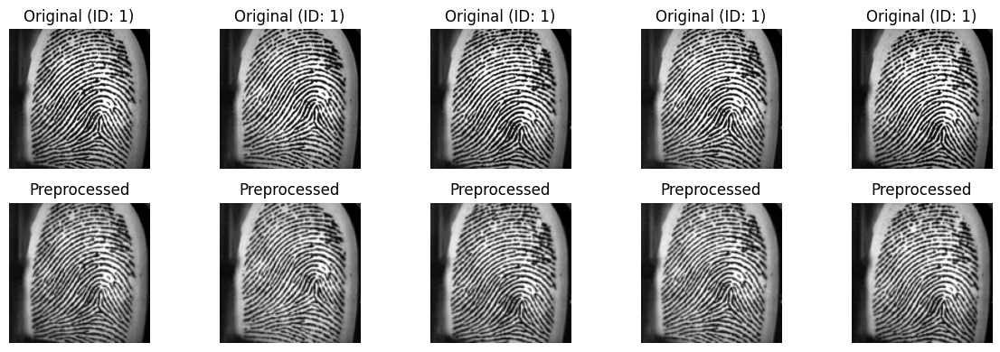


Step 3: Creating pairs for Siamese network...
Created 924 pairs (504 positive, 420 negative)


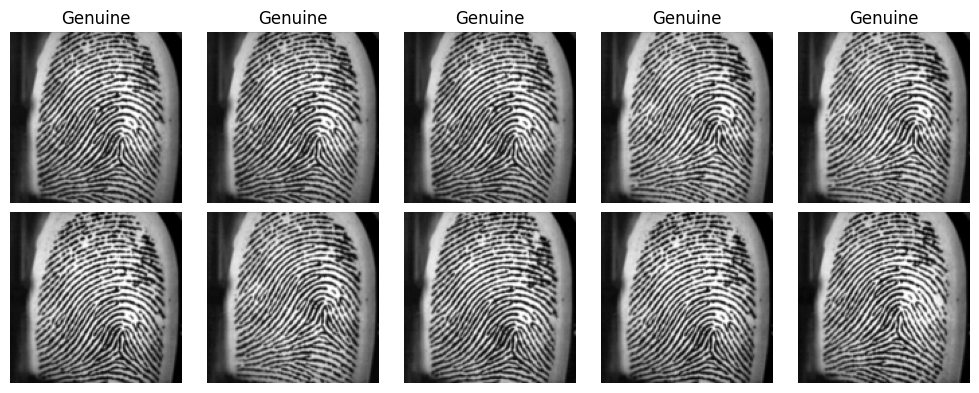


Step 4: Splitting data into train and test sets...
Training samples: 739
Testing samples: 185

Step 5: Building Siamese network model...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_5             │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_1 (Sequential) │ (None, 64)             │      1,155,584 │ input_layer_4[0][0],   │
│                           │                        │                │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 64)             │              0 │ sequential_1[0][0],    │
│                           │                        │                │ sequential_1[1][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 1)              │             65 │ lambda_1[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,155,649 (4.41 MB)

 Trainable params: 1,154,913 (4.41 MB)

 Non-trainable params: 736 (2.88 KB)


Training Siamese network...
Epoch 1/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.4923 - loss: 1.0296

47/47 ━━━━━━━━━━━━━━━━━━━━ 28s 265ms/step - accuracy: 0.4929 - loss: 1.0283 - val_accuracy: 0.5459 - val_loss: 0.6925 - learning_rate: 1.0000e-04
Epoch 2/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 20s 17ms/step - accuracy: 0.5470 - loss: 0.9276 - val_accuracy: 0.5243 - val_loss: 0.6881 - learning_rate: 1.0000e-04
Epoch 3/50
45/47 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5400 - loss: 0.8672

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5396 - loss: 0.8685 - val_accuracy: 0.5946 - val_loss: 0.6644 - learning_rate: 1.0000e-04
Epoch 4/50
45/47 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5481 - loss: 0.8866

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5478 - loss: 0.8845 - val_accuracy: 0.6378 - val_loss: 0.5978 - learning_rate: 1.0000e-04
Epoch 5/50
43/47 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5716 - loss: 0.7975

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5703 - loss: 0.8008 - val_accuracy: 0.6649 - val_loss: 0.5977 - learning_rate: 1.0000e-04
Epoch 6/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5871 - loss: 0.7724 - val_accuracy: 0.5838 - val_loss: 0.6098 - learning_rate: 1.0000e-04
Epoch 7/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6500 - loss: 0.6974 - val_accuracy: 0.6324 - val_loss: 0.6365 - learning_rate: 1.0000e-04
Epoch 8/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6387 - loss: 0.6811 - val_accuracy: 0.6432 - val_loss: 0.6108 - learning_rate: 1.0000e-04
Epoch 9/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6851 - loss: 0.6348 - val_accuracy: 0.6378 - val_loss: 0.5747 - learning_rate: 1.0000e-04
Epoch 10/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6920 - loss: 0.6133 - val_accuracy: 0.6108 - val_loss: 0.5672 - learning_rate: 1.0000e-04
Epoch 11/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6721 - loss: 0

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.7819 - loss: 0.4788 - val_accuracy: 0.7189 - val_loss: 0.4858 - learning_rate: 5.0000e-05
Epoch 26/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.8187 - loss: 0.4182 - val_accuracy: 0.6595 - val_loss: 0.5264 - learning_rate: 5.0000e-05
Epoch 27/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.7760 - loss: 0.4594 - val_accuracy: 0.6649 - val_loss: 0.5395 - learning_rate: 5.0000e-05
Epoch 28/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.7810 - loss: 0.4623 - val_accuracy: 0.6541 - val_loss: 0.5423 - learning_rate: 5.0000e-05
Epoch 29/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.7876 - loss: 0.4621 - val_accuracy: 0.6649 - val_loss: 0.5308 - learning_rate: 5.0000e-05
Epoch 30/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.7890 - loss: 0.4769 - val_accuracy: 0.6703 - val_loss: 0.5428 - learning_rate: 5.0000e-05
Epoch 31/50
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.7990 - los

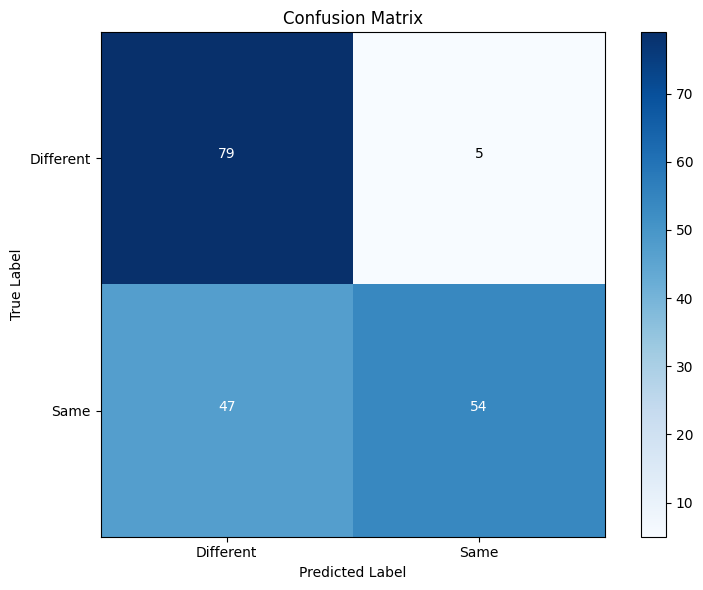

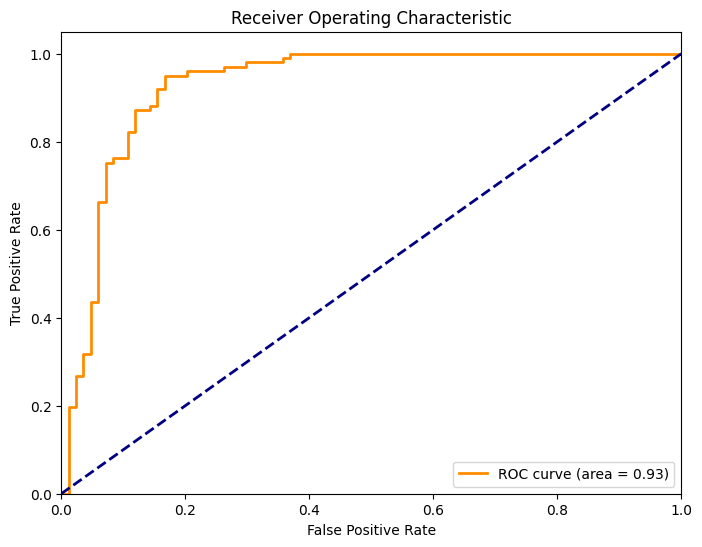

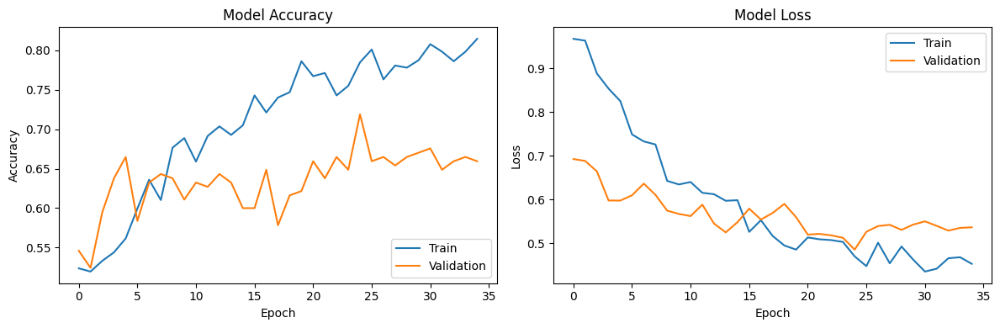


Step 7: Finding optimal threshold for authentication decisions...
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Optimal threshold: 0.3355
Accuracy at optimal threshold: 0.8973


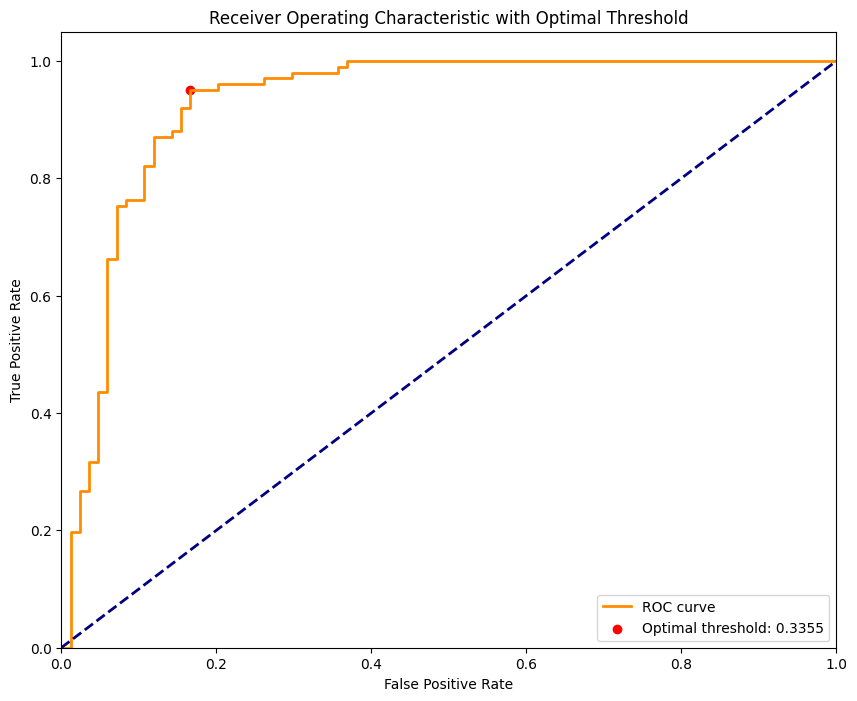


Step 8: Demonstrating fingerprint authentication...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 796ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


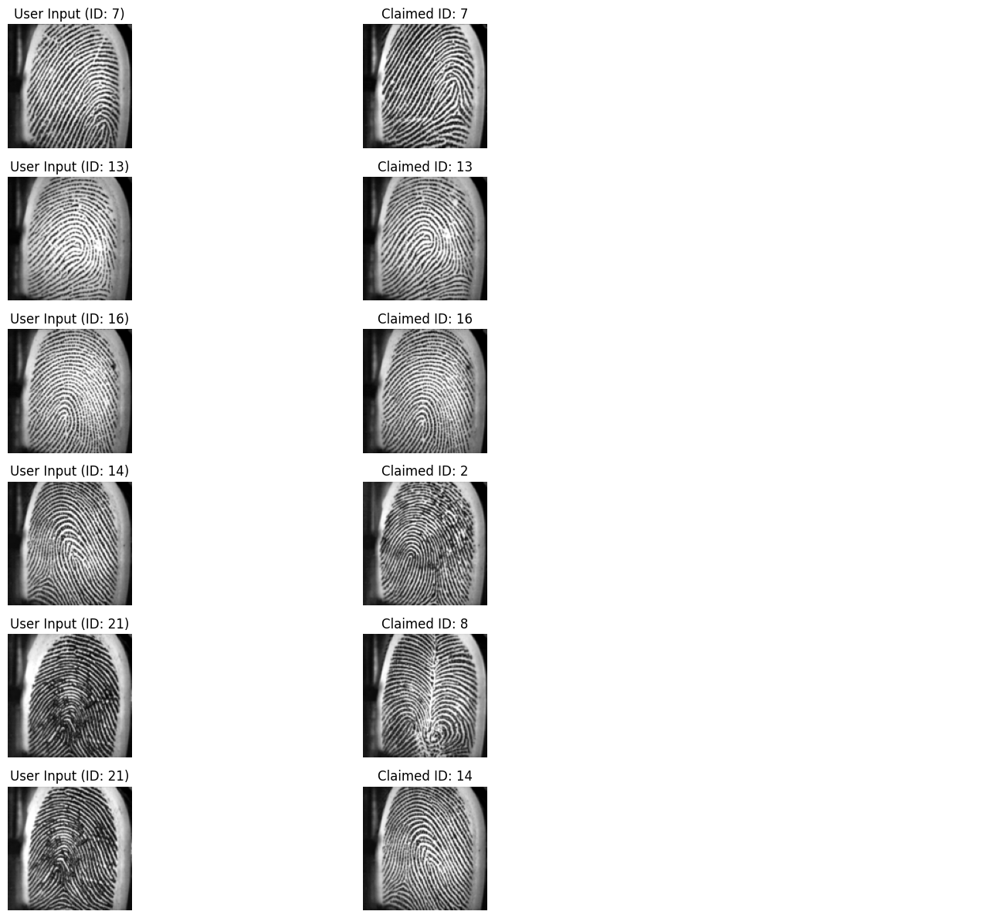


Fingerprint authentication system completed!


In [ ]:
def main():
    # 1. Load the raw images
    print("Step 1: Loading fingerprint images...")
    X, y = load_fingerprint_dataset()

    # 2. Preprocess images
    print("\nStep 2: Preprocessing images...")
    X_processed = preprocess_images(X)

    # Display some original and preprocessed images
    plt.figure(figsize=(12, 4))
    for i in range(5):
        plt.subplot(2, 5, i + 1)
        plt.imshow(X[i].reshape(256, 256), cmap='gray')
        plt.title(f"Original (ID: {y[i]})")
        plt.axis('off')

        plt.subplot(2, 5, i + 6)
        plt.imshow(X_processed[i].reshape(128, 128), cmap='gray')
        plt.title("Preprocessed")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # 3. Generate siamese network data
    print("\nStep 3: Creating pairs for Siamese network...")
    pairs, pair_labels = create_pairs(X_processed, y)

    print(f"Created {len(pairs)} pairs ({np.sum(pair_labels)} positive, {len(pair_labels) - np.sum(pair_labels)} negative)")

    # Display sample pairs
    display_pairs(pairs, pair_labels)

    # 4. Split into train and test
    print("\nStep 4: Splitting data into train and test sets...")
    x_train, y_train, x_test, y_test = prepare_data_for_training(pairs, pair_labels)

    print(f"Training samples: {len(y_train)}")
    print(f"Testing samples: {len(y_test)}")

    # 5. Build and train Siamese network
    print("\nStep 5: Building Siamese network model...")
    siamese_model = build_siamese_network()
    siamese_model.summary()

    print("\nTraining Siamese network...")
    history = train_model(siamese_model, x_train, y_train, x_test, y_test, batch_size=16, epochs=50)

    # 6. Evaluate model
    print("\nStep 6: Evaluating model performance...")
    accuracy, roc_auc = evaluate_model(siamese_model, x_test, y_test)

    # Plot training history
    plot_training_history(history)

    # 7. Find optimal threshold
    print("\nStep 7: Finding optimal threshold for authentication decisions...")
    optimal_threshold = find_optimal_threshold(siamese_model, x_test, y_test)

    # 8. Authentication demo
    print("\nStep 8: Demonstrating fingerprint authentication...")
    biometric_verification_demo(siamese_model, X_processed, y, n_examples=3)

    print("\nFingerprint authentication system completed!")

if __name__ == "__main__":
    main()

## Contrastive Loss

### ResNet50

In [ ]:
# Building the Model
#1. Build the Embedding Network Structure
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Input, Conv2D

def embedding_network(in_shape):
    input_layer = Input(shape=in_shape)

    # Convert 1-channel to 3-channel by repeating it
    x = Conv2D(3, (1, 1), activation=None)(input_layer)  # 1x1 Conv to expand channels

    base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(128, 128, 3))
    base_model.trainable = False  # Freeze ResNet50 layers

    x = base_model(x, training=False)
    x = Flatten()(x)
    x = BatchNormalization()(x)
    x = Dense(128, activation="relu")(x)
    x = Dense(52, activation="relu")(x)

    return Model(inputs=input_layer, outputs=x)


#2. Build the Siamese Network Structure
# Define the energy function
def euclidean_distance(vectors):
        vector1, vector2 = vectors
        sum_square = keras.ops.sum(keras.ops.square(vector1 - vector2), axis=1, keepdims=True)
        return keras.ops.sqrt(keras.ops.maximum(sum_square, keras.backend.epsilon()))

def SiameseNetwork(in_shape):
    # 2.1. Define the twin networks using the embedding network
    input_1 = keras.layers.Input(in_shape)
    input_2 = keras.layers.Input(in_shape)

    # The siamese network shares weights between twin networks.
    #To allow this, we will use the same embedding network for both networks.
    embedding_net_obj = embedding_network(in_shape)

    twin_1 = (embedding_net_obj)(input_1)
    twin_2 = (embedding_net_obj)(input_2)

    # 2.2. Make sure the energy function has been defined

    # 2.3. Merge the twin networks using the energy function
    merge_layer = keras.layers.Lambda(euclidean_distance, output_shape=(1,))([twin_1, twin_2])

    # 2.4. Normalize and send to sigmoid (optional step)
    norm_layer = keras.layers.BatchNormalization()(merge_layer)
    output_layer = keras.layers.Dense(1, activation="sigmoid")(norm_layer)

    return keras.Model(inputs=[input_1, input_2], outputs=output_layer)

#3. Define the loss function
def loss(m=1):

    def contrastive_loss(Y, D): # takes y_true and y_pred
        # L(Y, D) = Y * D**2 + (1 - Y) * max(0, m - D)**2
        loss = Y * keras.ops.square(D) + (1 - Y) * keras.ops.square(keras.ops.maximum(0, m - D))
        return keras.ops.mean(loss)

    return contrastive_loss
#4. Instantiate and compile the model
def custom_accuracy(y_true, y_pred):
    return keras.ops.mean(keras.ops.equal(y_true, keras.ops.cast(y_pred[:,0] < 0.5, "int32")))
siamese_model = SiameseNetwork(img_shape)
siamese_model.compile(loss=loss(1), optimizer="adam", metrics=[custom_accuracy])
siamese_model.summary()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_39            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_40            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional_25             │ (None, 52)             │     27,919,930 │ input_layer_39[0][0],  │
│ (Functional)              │                        │                │ input_layer_40[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_12 (Lambda)        │ (None, 1)              │              0 │ functional_25[0][0],   │
│                           │                        │                │ functional_25[1][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_24    │ (None, 1)              │              4 │ lambda_12[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_38 (Dense)          │ (None, 1)              │              2 │ batch_normalization_2… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 27,919,936 (106.51 MB)

 Trainable params: 4,266,686 (16.28 MB)

 Non-trainable params: 23,653,250 (90.23 MB)

In [ ]:
#5. Fit the model
history = siamese_model.fit(
    [x_train[:,0], x_train[:,1]],
    y_train,
    validation_data=([x_test[:,0], x_test[:,1]], y_test),
    batch_size=100,
    epochs=10,
)

Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - custom_accuracy: 0.9026 - loss: 0.1123 - val_custom_accuracy: 0.5933 - val_loss: 0.2180
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 47s 411ms/step - custom_accuracy: 0.9878 - loss: 0.0697 - val_custom_accuracy: 0.5220 - val_loss: 0.2411
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 21s 423ms/step - custom_accuracy: 0.9921 - loss: 0.0575 - val_custom_accuracy: 0.5220 - val_loss: 0.2514
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 413ms/step - custom_accuracy: 0.9988 - loss: 0.0495 - val_custom_accuracy: 0.5220 - val_loss: 0.2478
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 409ms/step - custom_accuracy: 0.9996 - loss: 0.0437 - val_custom_accuracy: 0.5296 - val_loss: 0.2256
Epoch 6/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 21s 419ms/step - custom_accuracy: 1.0000 - loss: 0.0378 - val_custom_accuracy: 0.6058 - val_loss: 0.1742
Epoch 7/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 414ms/step - custom_accuracy: 1.0000 - loss: 0.0340 - val_custom_accuracy: 0.8884 - val_loss: 0.1185
Ep

In [ ]:

#6. Test and evaluate the model
results = siamese_model.evaluate([x_test[:,0], x_test[:,1]], y_test)
print("test loss, test acc:", results)

45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - custom_accuracy: 0.9982 - loss: 0.0274
test loss, test acc: [0.027652697637677193, 0.9979166388511658]


45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step


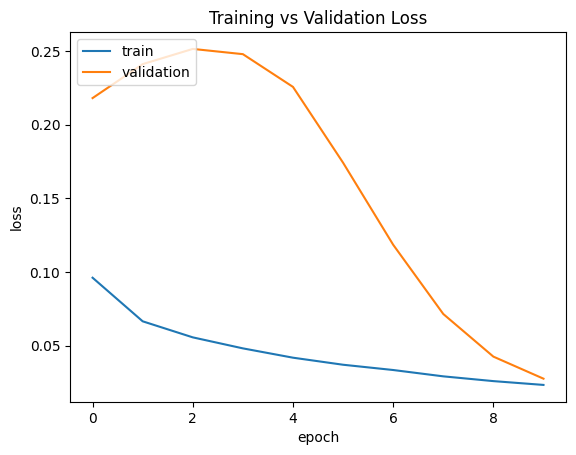

In [ ]:

custom_accuracy(y_test, siamese_model.predict([x_test[:,0], x_test[:,1]]))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train", "validation"], loc="upper left")
plt.title("Training vs Validation Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step


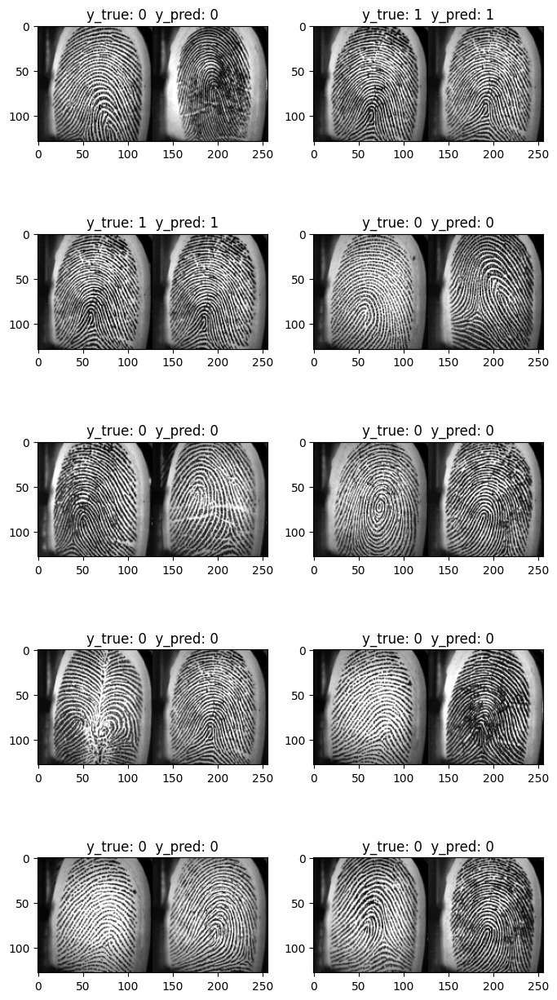

In [ ]:

predictions = siamese_model.predict([x_test[:,0], x_test[:,1]])
fig, axes = plt.subplots(5, 2, figsize=(8, 16))
for i in range(10):
    ax = axes[i // 2, i % 2]
    img_idx = random.randint(0, len(x_test))
    ax.imshow(keras.ops.concatenate([x_test[img_idx][0], x_test[img_idx][1]], axis=1), cmap='gray')
    ax.set_title("y_true: {}".format(y_test[img_idx]) + "  y_pred: {}".format(int(predictions[img_idx][0]<0.5)))


### ResNet50 Architecture

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import (
    Conv2D, Dense, Flatten, BatchNormalization, Dropout, Input, MaxPooling2D, AveragePooling2D
)
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, ReLU, Add, Flatten, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Residual Block
def residual_block(x, filters, kernel_size=(3, 3), stride=1):
    shortcut = x  # Save input for skip connection

    # First Conv layer
    x = Conv2D(filters, kernel_size, strides=stride, padding="same", use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Second Conv layer
    x = Conv2D(filters, kernel_size, strides=1, padding="same", use_bias=False)(x)
    x = BatchNormalization()(x)

    # Match dimensions using 1x1 Conv if needed
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, (1, 1), strides=stride, padding="same", use_bias=False)(shortcut)
        shortcut = BatchNormalization()(shortcut)

    # Add shortcut (skip connection)
    x = Add()([x, shortcut])
    x = ReLU()(x)

    return x

# Custom ResNet Architecture
def embedding_network(in_shape):
    input_layer = Input(shape=in_shape)

    # Initial Conv Layer
    x = Conv2D(64, (7, 7), strides=2, padding="same", use_bias=False)(input_layer)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Residual Blocks (ResNet Style)
    x = residual_block(x, 64)
    x = residual_block(x, 128, stride=2)  # Downsample
    x = residual_block(x, 256, stride=2)  # Downsample
    x = residual_block(x, 512, stride=2)  # Downsample

    # Global Pooling & Dense Layers
    x = GlobalAveragePooling2D()(x)
    x = Flatten()(x)
    x = Dense(128, activation="relu")(x)
    x = Dense(52, activation="relu")(x)

    return Model(inputs=input_layer, outputs=x)



# 2. Build the Siamese Network Structure
def euclidean_distance(vectors):
    vector1, vector2 = vectors
    sum_square = keras.ops.sum(keras.ops.square(vector1 - vector2), axis=1, keepdims=True)
    return keras.ops.sqrt(keras.ops.maximum(sum_square, keras.backend.epsilon()))

def SiameseNetwork(in_shape):
    input_1 = Input(in_shape)
    input_2 = Input(in_shape)

    embedding_net = embedding_network(in_shape)

    twin_1 = embedding_net(input_1)
    twin_2 = embedding_net(input_2)

    merge_layer = keras.layers.Lambda(euclidean_distance, output_shape=(1,))([twin_1, twin_2])
    norm_layer = BatchNormalization()(merge_layer)
    output_layer = Dense(1, activation="sigmoid")(norm_layer)

    return Model(inputs=[input_1, input_2], outputs=output_layer)



# Example Usage
img_shape = (128, 128, 1)  # Grayscale input
model = embedding_network(img_shape)
model.summary()


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_30            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_62 (Conv2D)        │ (None, 64, 64, 64)     │          3,136 │ input_layer_30[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_68    │ (None, 64, 64, 64)     │            256 │ conv2d_62[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_26 (ReLU)           │ (None, 64, 64, 64)     │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_63 (Conv2D)        │ (None, 64, 64, 64)     │         36,864 │ re_lu_26[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_69    │ (None, 64, 64, 64)     │            256 │ conv2d_63[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_27 (ReLU)           │ (None, 64, 64, 64)     │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_64 (Conv2D)        │ (None, 64, 64, 64)     │         36,864 │ re_lu_27[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_70    │ (None, 64, 64, 64)     │            256 │ conv2d_64[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_16 (Add)              │ (None, 64, 64, 64)     │              0 │ batch_normalization_7… │
│                           │                        │                │ re_lu_26[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_28 (ReLU)           │ (None, 64, 64, 64)     │              0 │ add_16[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_65 (Conv2D)        │ (None, 32, 32, 128)    │         73,728 │ re_lu_28[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_71    │ (None, 32, 32, 128)    │            512 │ conv2d_65[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_29 (ReLU)           │ (None, 32, 32, 128)    │              0 │ batch_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_66 (Conv2D)        │ (None, 32, 32, 128)    │        147,456 │ re_lu_29[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_67 (Conv2D)        │ (None, 32, 32, 128)    │          8,192 │ re_lu_28[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7

 Total params: 4,977,652 (18.99 MB)

 Trainable params: 4,971,892 (18.97 MB)

 Non-trainable params: 5,760 (22.50 KB)

In [ ]:
# 3. Improved Loss Function
def loss(m=0.5):  # Reduced margin
    def contrastive_loss(y_true, y_pred):
        return keras.ops.mean(
            y_true * keras.ops.square(y_pred) +
            (1 - y_true) * keras.ops.square(keras.ops.maximum(0, m - y_pred))
        )
    return contrastive_loss

# 4. Instantiate and Compile the Model
def custom_accuracy(y_true, y_pred):
    return keras.ops.mean(keras.ops.equal(y_true, keras.ops.cast(y_pred[:, 0] < 0.5, "int32")))

img_shape = (128, 128, 1)
siamese_model = SiameseNetwork(img_shape)
siamese_model.compile(loss=loss(0.5), optimizer=keras.optimizers.Adam(learning_rate=1e-4), metrics=[custom_accuracy])
siamese_model.summary()


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_27            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_28            │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional_14             │ (None, 128)            │     17,181,824 │ input_layer_27[0][0],  │
│ (Functional)              │                        │                │ input_layer_28[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_7 (Lambda)         │ (None, 1)              │              0 │ functional_14[0][0],   │
│                           │                        │                │ functional_14[1][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_67    │ (None, 1)              │              4 │ lambda_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_24 (Dense)          │ (None, 1)              │              2 │ batch_normalization_6… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 17,181,830 (65.54 MB)

 Trainable params: 17,180,932 (65.54 MB)

 Non-trainable params: 898 (3.51 KB)

In [ ]:
# 5. Training with Early Stopping
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True
)

history = siamese_model.fit(
    [x_train[:, 0], x_train[:, 1]],
    y_train,
    validation_data=([x_test[:, 0], x_test[:, 1]], y_test),
    batch_size=64,  # Smaller batch size for stability
    epochs=50,  # More training epochs
    callbacks=[early_stopping]
)

Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 24s 289ms/step - custom_accuracy: 0.6328 - loss: 0.1406 - val_custom_accuracy: 0.5279 - val_loss: 0.1143
Epoch 2/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - custom_accuracy: 0.8054 - loss: 0.0956 - val_custom_accuracy: 0.5279 - val_loss: 0.1202
Epoch 3/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - custom_accuracy: 0.8568 - loss: 0.0864 - val_custom_accuracy: 0.5279 - val_loss: 0.1168
Epoch 4/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 9s 169ms/step - custom_accuracy: 0.8846 - loss: 0.0844 - val_custom_accuracy: 0.5279 - val_loss: 0.0922
Epoch 5/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - custom_accuracy: 0.9052 - loss: 0.0756 - val_custom_accuracy: 0.5442 - val_loss: 0.0561
Epoch 6/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - custom_accuracy: 0.9110 - loss: 0.0711 - val_custom_accuracy: 0.6793 - val_loss: 0.0380
Epoch 7/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - custom_accuracy: 0.9224 - loss: 0.0728 - val_custom_accuracy: 0.8336 - val_loss: 0.0314
Ep

In [ ]:

#6. Test and evaluate the model
results = siamese_model.evaluate([x_test[:,0], x_test[:,1]], y_test)
print("test loss, test acc:", results)

45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - custom_accuracy: 0.9451 - loss: 0.0083
test loss, test acc: [0.008247477933764458, 0.9451388716697693]


45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step


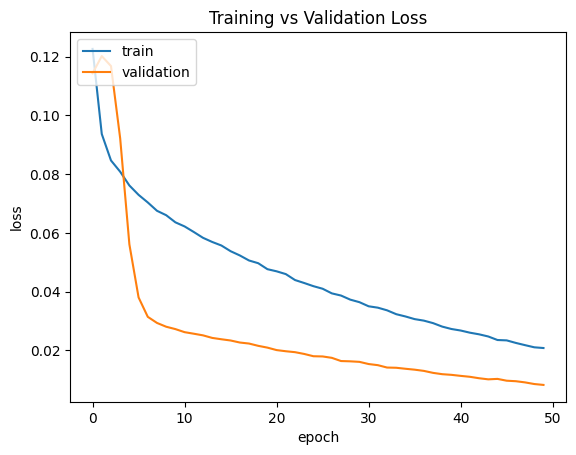

In [ ]:

custom_accuracy(y_test, siamese_model.predict([x_test[:,0], x_test[:,1]]))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train", "validation"], loc="upper left")
plt.title("Training vs Validation Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


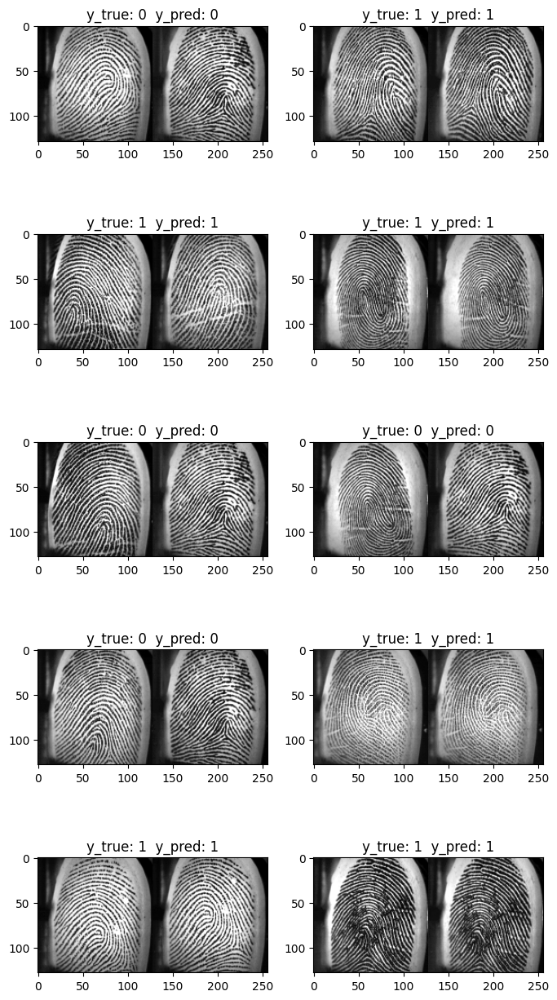

In [ ]:

predictions = siamese_model.predict([x_test[:,0], x_test[:,1]])
fig, axes = plt.subplots(5, 2, figsize=(8, 16))
for i in range(10):
    ax = axes[i // 2, i % 2]
    img_idx = random.randint(0, len(x_test))
    ax.imshow(keras.ops.concatenate([x_test[img_idx][0], x_test[img_idx][1]], axis=1), cmap='gray')
    ax.set_title("y_true: {}".format(y_test[img_idx]) + "  y_pred: {}".format(int(predictions[img_idx][0]<0.5)))


# Triplet network.

In [ ]:
import os
import cv2
import keras
import random
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

In [ ]:
PATH = "data"

In [ ]:
def load_raw_data(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Path '{path}' does not exist.")

    all_images = []
    all_labels = []

    files = os.listdir(path)
    print("First 10 files:", files[:10])  # Debugging step

    for file_name in files:
        if not file_name.endswith(".bmp"):  # Ensure it's a BMP image
            continue

        # Extract class label (finger ID) from filename, assuming format '7_6.bmp'
        class_label = file_name.split("_")[0]

        # Load the image
        img_path = os.path.join(path, file_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            print(f"Skipping unreadable image: {img_path}")
            continue

        img = np.reshape(img, (img.shape[0], img.shape[1], 1))

        all_images.append(img)
        all_labels.append(class_label)  # Store the extracted class label

    all_images = np.array(all_images)
    all_labels = np.array(all_labels)

    print("Loaded images:", all_images.shape)
    print("Unique classes:", np.unique(all_labels))

    return all_images, all_labels

# Load dataset
all_images, all_labels = load_raw_data(PATH)

First 10 files: ['10_1.bmp', '10_2.bmp', '10_3.bmp', '10_4.bmp', '10_5.bmp', '10_6.bmp', '10_7.bmp', '10_8.bmp', '11_1.bmp', '11_2.bmp']
Loaded images: (168, 256, 256, 1)
Unique classes: ['1' '10' '11' '12' '13' '14' '15' '16' '17' '18' '19' '2' '20' '21' '3'
 '4' '5' '6' '7' '8' '9']


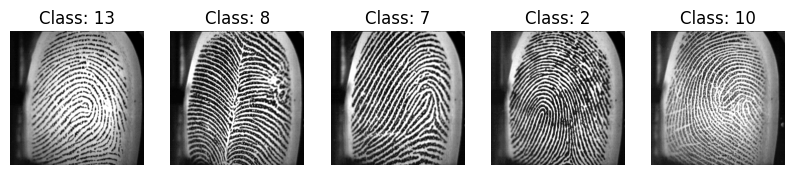

In [ ]:
def show_random_samples(images, labels, num_samples=5):
    unique_classes = np.unique(labels)
    selected_images = []
    selected_labels = []

    sampled_classes = np.random.choice(unique_classes, min(num_samples, len(unique_classes)), replace=False)

    for class_label in sampled_classes:
        indices = np.where(labels == class_label)[0]
        random_index = np.random.choice(indices)  # Pick a random index from this class
        selected_images.append(images[random_index])
        selected_labels.append(labels[random_index])

    # Plot the selected images
    plt.figure(figsize=(10, 5))
    for i in range(len(selected_images)):
        plt.subplot(1, len(selected_images), i + 1)
        plt.imshow(selected_images[i].squeeze(), cmap="gray")
        plt.title(f"Class: {selected_labels[i]}")
        plt.axis("off")
    plt.show()

# Show random samples
show_random_samples(all_images, all_labels, num_samples=5)

In [ ]:
def preprocess_data(images, target_size=(128, 128)):
    """ Preprocess images: resize, normalize, and reshape """
    processed_images = []
    for img in images:
        img = cv2.resize(img, target_size)  # Resize image
        img = img.astype(np.float32) / 255.0  # Normalize to [0,1]
        img = np.expand_dims(img, axis=-1)  # Ensure shape (H, W, 1)
        processed_images.append(img)

    return np.array(processed_images)


# Apply preprocessing after loading
all_images = preprocess_data(all_images)

print("Preprocessed images shape:", all_images.shape)

Preprocessed images shape: (168, 128, 128, 1)


In [ ]:
def generate_dataset(images, labels, dataset_size):
    X = []
    unique_combinations = set()  # To track unique combinations

    classes = np.unique(labels)
    class_finger = []
    class_idx = {}

    for i in range(len(classes)):
        class_finger.append(np.where(labels == classes[i])[0])
        class_idx[str(classes[i])] = i

    required_iterations = int(dataset_size / len(images))

    for itr in range(required_iterations):
        for i in range(len(images)):
            anchor = images[i]
            anchor_label = labels[i]

            pos_idx = random.choice(class_finger[class_idx[str(anchor_label)]])
            positive = images[pos_idx]

            different_class = random.randint(0, len(classes) - 1)
            while different_class == class_idx[str(anchor_label)]:
                different_class = random.randint(0, len(classes) - 1)

            neg_idx = random.choice(class_finger[different_class])
            negative = images[neg_idx]

            # Create a tuple to represent the combination
            combination = (tuple(anchor.flatten()), tuple(positive.flatten()), tuple(negative.flatten()))

            # Add only unique combinations
            if combination not in unique_combinations:
                unique_combinations.add(combination)
                X.append([anchor, positive, negative])

    return np.array(X)

In [ ]:
DATASET_SIZE = 4800
preprocessed_images = preprocess_data(all_images)
X = generate_dataset(preprocessed_images, all_labels, DATASET_SIZE)
y = np.zeros((X.shape[0],))

In [ ]:
print(f"Generated dataset shape: {X.shape}")

Generated dataset shape: (4652, 3, 128, 128, 1)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


print(f"Training set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")

Training set shape: (3721, 3, 128, 128, 1)
Test set shape: (931, 3, 128, 128, 1)


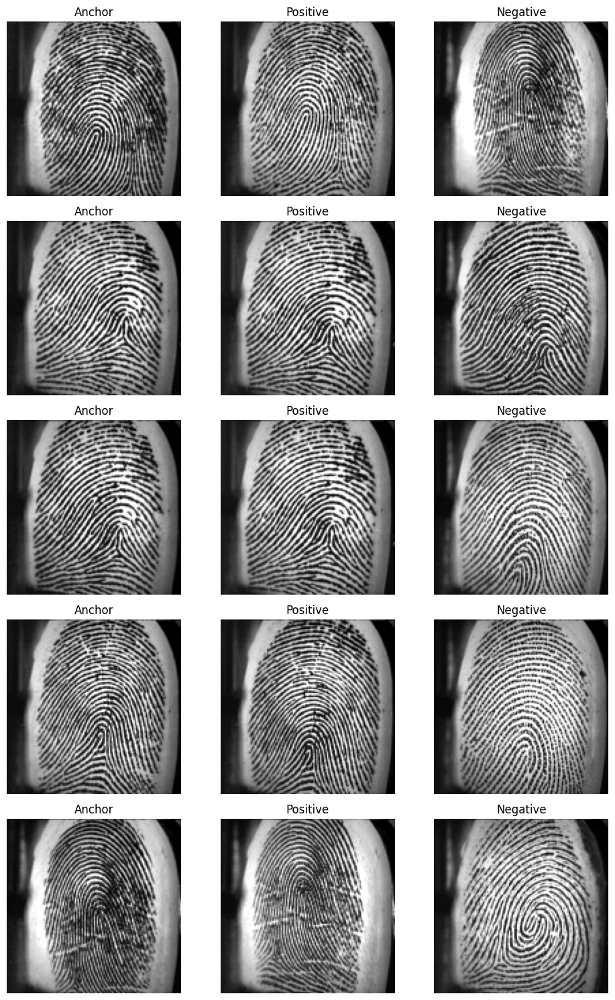

In [ ]:
def show_positive_negative_samples(X, y, num_samples=5):
    fig, axes = plt.subplots(num_samples, 3, figsize=(10, num_samples * 3))

    for i in range(num_samples):
        anchor, positive, negative = X[i]

        axes[i, 0].imshow(anchor.squeeze(), cmap='gray')
        axes[i, 0].set_title("Anchor")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(positive.squeeze(), cmap='gray')
        axes[i, 1].set_title("Positive")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(negative.squeeze(), cmap='gray')
        axes[i, 2].set_title("Negative")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Show examples of positive and negative labels
show_positive_negative_samples(X_train, y_train, num_samples=5)

In [ ]:
import keras.layers

def embedding_network(input_shape):
    model = keras.Sequential([
        layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.5)
    ])
    return model

In [ ]:
class DistanceLayer(keras.layers.Layer):

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), axis=-1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), axis=-1)
        return ap_distance, an_distance


In [ ]:
from tensorflow.keras import layers

anchor_input = keras.layers.Input((128, 128, 1), name='anchor')
positive_input = keras.layers.Input((128, 128, 1), name='positive')
negative_input = keras.layers.Input((128, 128, 1), name='negative')

embedding_net_obj = embedding_network((128, 128, 1))

triplet_1 = embedding_net_obj(anchor_input)
triplet_2 = embedding_net_obj(positive_input)
triplet_3 = embedding_net_obj(negative_input)

merge_layer = DistanceLayer()(triplet_1, triplet_2, triplet_3)

complete_model = keras.Model(inputs=[anchor_input, positive_input, negative_input], outputs=merge_layer)


In [ ]:
complete_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
anchor (InputLayer)             [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
positive (InputLayer)           [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
negative (InputLayer)           [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 128)          14820224    anchor[0][0]                     
                                                                 positive[0][0]               

In [ ]:
class SiameseModel(keras.Model):
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        self.siamese_network = siamese_network
        self.margin = margin

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        # Unpack the data
        (anchor, positive, negative), _ = data
        with tf.GradientTape() as tape:
            ap_distance, an_distance = self.siamese_network((anchor, positive, negative))
            loss = self._compute_loss(ap_distance, an_distance)
        gradients = tape.gradient(loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_weights))
        return {"loss": loss}

    def _compute_loss(self, ap_distance, an_distance):
        return tf.reduce_mean(tf.maximum(ap_distance - an_distance + self.margin, 0.0))


In [ ]:
siamese_model = SiameseModel(complete_model)
siamese_model.compile(optimizer=Adam(0.001))

In [ ]:
history = siamese_model.fit([X_train[:, 0], X_train[:, 1], X_train[:, 2]], y_train, batch_size=32, epochs=10)

Epoch 1/10
117/117 [==============================] - 20s 97ms/step - loss: 0.3943
Epoch 2/10
117/117 [==============================] - 10s 87ms/step - loss: 0.0301
Epoch 3/10
117/117 [==============================] - 10s 90ms/step - loss: 0.0067
Epoch 4/10
117/117 [==============================] - 10s 86ms/step - loss: 0.0028
Epoch 5/10
117/117 [==============================] - 10s 87ms/step - loss: 0.0055
Epoch 6/10
117/117 [==============================] - 10s 86ms/step - loss: 0.0117
Epoch 7/10
117/117 [==============================] - 10s 87ms/step - loss: 0.0025
Epoch 8/10
117/117 [==============================] - 10s 86ms/step - loss: 1.3397e-04
Epoch 9/10
117/117 [==============================] - 10s 87ms/step - loss: 0.0000e+00
Epoch 10/10
117/117 [==============================] - 10s 86ms/step - loss: 0.0000e+00


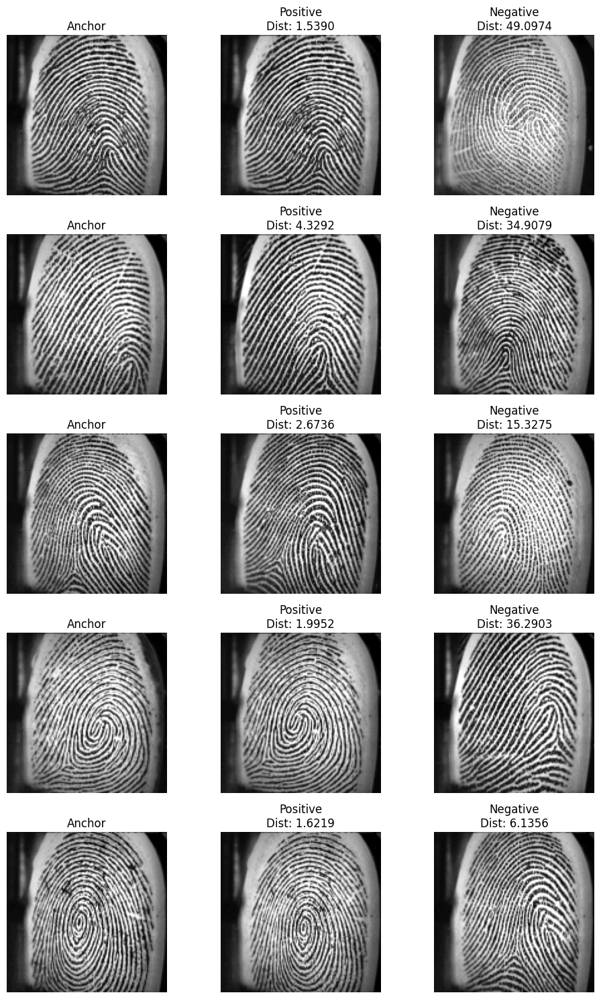

In [ ]:
def test_model(model, X_test, num_samples=5):
    fig, axes = plt.subplots(num_samples, 3, figsize=(10, num_samples * 3))

    for i in range(num_samples):
        anchor, positive, negative = X_test[i]

        # Get the embeddings
        anchor_embedding = model.siamese_network.get_layer('sequential')(np.expand_dims(anchor, axis=0))
        positive_embedding = model.siamese_network.get_layer('sequential')(np.expand_dims(positive, axis=0))
        negative_embedding = model.siamese_network.get_layer('sequential')(np.expand_dims(negative, axis=0))

        # Calculate distances
        ap_distance = np.sum(np.square(anchor_embedding - positive_embedding))
        an_distance = np.sum(np.square(anchor_embedding - negative_embedding))

        # Plot the images
        axes[i, 0].imshow(anchor.squeeze(), cmap='gray')
        axes[i, 0].set_title("Anchor")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(positive.squeeze(), cmap='gray')
        axes[i, 1].set_title(f"Positive\nDist: {ap_distance:.4f}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(negative.squeeze(), cmap='gray')
        axes[i, 2].set_title(f"Negative\nDist: {an_distance:.4f}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Test the model on validation dataset
test_model(siamese_model, X_test, num_samples=5)

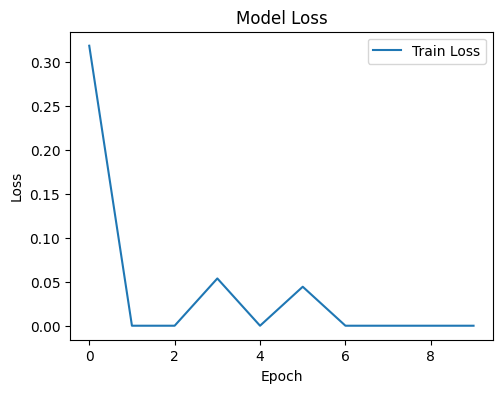

In [ ]:
# Plot training & validation accuracy and loss
plt.figure(figsize=(12, 4))

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
#siamese_model.save('siamese_model2', save_format='tf')

In [ ]:
#siamese_model.save_weights('siamese_model_weights2.h5')

#Menna Elminshawy
#Ahmad Wael Abdelaziz
#Jana Soliman
#Radwa Belal
#Mariam Behairy